# Predicting Migration Routes in Missing Migrants Dataset

This Jupyter notebook aims to explore, preprocess, and analyze the Missing Migrants dataset. The primary objective is to build a machine learning model to predict 'Migration Routes' for instances where this information is missing. Various machine learning algorithms are trained and evaluated to identify the best-performing model. The notebook follows a structured approach, including data cleaning, feature selection, and model evaluation, to make the predictions as accurate as possible. The final dataset, with the missing 'Migration Routes' filled in, is saved as a CSV file for future analysis.


In [1]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor

## Data Overview

In [47]:
file_path = 'data/merged_records_eda_causes_treated.csv'
data = pd.read_csv(file_path)
data_original = data

In [3]:
data

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,number_dead,minimum_estimated_number_of_missing,total_dead_and_missing,number_of_survivors,number_of_females,...,dehydration_malnutrition,drowning,environmental_factors,lack_of_access_to_healthcare,murder_violence,sexual_abuse_rape,suicide,unknown,war_related,main_cause
0,2014,1,Central America,North America,Guatemala,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,unknown
1,2014,1,Latin America / Caribbean (P),North America,Unknown,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,unknown
2,2014,1,Latin America / Caribbean (P),North America,Unknown,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,unknown
3,2014,1,Central America,North America,Mexico,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,murder_violence
4,2014,1,Northern Africa,Europe,Sudan,1.0,0.0,1,2.0,0.0,...,0,0,0,0,0,0,0,0,0,environmental_factors
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14180,2014,1,Unknown,Europe,Unknown,1.0,0.0,1,2.0,0.0,...,0,0,0,0,0,0,0,0,0,accident
14181,2014,1,Unknown,Mediterranean,Unknown,12.0,0.0,12,0.0,9.0,...,0,0,0,0,0,0,0,0,0,drowning
14182,2014,1,Unknown,US-Mexico Border,Unknown,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,murder_violence
14183,2014,1,Unknown,US-Mexico Border,Unknown,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,murder_violence


In [4]:
data['migration_route'].value_counts()

migration_route
Central America to US                4188
Sahara Desert crossing               1677
Central Mediterranean                1276
Western Mediterranean                 681
Afghanistan to Iran                   442
Eastern Mediterranean                 342
Western African                       263
Western Balkans                       220
Horn Africa to Yemen                  163
Turkey-Europe land route              159
English Channel to the UK             136
Syria to Türkiye                      116
Darien Gap                             89
Cuba to US                             63
Belarus-EU border                      61
Dominican Republic to Puerto Rico      42
Iran to Turkey                         34
Italy to France                        34
Haiti to Dominican Republic            16
Comoros to Mayotte                     15
Venezuela to Caribbean                 11
Ukraine to Europe                       9
Name: count, dtype: int64

In [5]:
from scipy.spatial.distance import euclidean
# Function to calculate distance between two points (lat, lon)
def calculate_distance(row, center_lat, center_lon):
    return euclidean((row['lat'], row['lon']), (center_lat, center_lon))

In [6]:
import folium
from geopy.distance import great_circle

# Create a new map centered at the average latitude and longitude of incidents
map_center = [data['lat'].mean(), data['lon'].mean()]
m = folium.Map(location=map_center, zoom_start=2)

# Color map
color_list = [
    'orange', 'beige', 'black', 'darkgreen', 'cadetblue', 'darkblue', 'darkred', 'pink', 
    'gray', 'purple', 'darkpurple', 'lightgray', 'red', 'green', 'blue', 'white'
]

unique_groups = data['unsd_geographical_grouping'].unique()
color_map = {group: color for group, color in zip(unique_groups, color_list)}

# Add the incidents to the map
for idx, row in data[data['migration_route'].isna()].iterrows():
    lat, lon = row['lat'], row['lon']
    unsd_group = row['unsd_geographical_grouping']
#     color = color_map.get(unsd_group, 'black')
    folium.CircleMarker(location=[lat, lon], radius=3, color='black', fill=True, fill_color='black', popup = f'{unsd_group}|{lat}|{lat}').add_to(m)

# Calculate the geographical center for each unsd_geographical_grouping and add it to the map
grouped_data = data.groupby('unsd_geographical_grouping').agg({'lat': 'mean', 'lon': 'mean'}).reset_index()
for idx, row in grouped_data.iterrows():
    lat, lon = row['lat'], row['lon']
    unsd_group = row['unsd_geographical_grouping']
    color = color_map.get(unsd_group, 'black')
    folium.Marker(location=[lat, lon], popup=unsd_group, icon=folium.Icon(color=color)).add_to(m)

# Calculate the geographical center for each unsd_geographical_grouping and add it to the map
grouped_data = data[~data['migration_route'].isna()].groupby('migration_route').agg({'lat': 'mean', 'lon': 'mean'}).reset_index()
for idx, row in grouped_data.iterrows():
    lat, lon = row['lat'], row['lon']
    unsd_group = row['migration_route']
    color = color_map.get(unsd_group, 'black')
    folium.Marker(location=[lat, lon], popup=unsd_group, icon=folium.Icon(color=color)).add_to(m)

# Calculate the center and radius for South Eastern Asia
southeast_asia_data = data[data['unsd_geographical_grouping'] == 'South-eastern Asia']
southeast_asia_center = (southeast_asia_data['lat'].mean(), southeast_asia_data['lon'].mean())
distances_to_center_seasia = southeast_asia_data.apply(
    lambda row: great_circle((row['lat'], row['lon']), southeast_asia_center).kilometers,
    axis=1
)
radius_seasia_km = distances_to_center_seasia.max()
folium.Circle(
    location=southeast_asia_center,
    radius=radius_seasia_km * 1000,
    color='blue',
    fill=False,
    popup=f'South Eastern Asia Radius: {radius_seasia_km:.2f} km'
).add_to(m)



# Calculate the center and radius for Southern Africa
southern_africa_data = data[data['unsd_geographical_grouping'] == 'Southern Africa']
southern_africa_center = (southern_africa_data['lat'].mean(), southern_africa_data['lon'].mean())
distances_to_center_safrica = southern_africa_data.apply(
    lambda row: great_circle((row['lat'], row['lon']), southern_africa_center).kilometers,
    axis=1
)

# Drop the top 5 distances from southern_africa_data
top_indices_to_drop = distances_to_center_safrica.nlargest(1).index
distances_to_center_safrica_dropped = distances_to_center_safrica.drop(top_indices_to_drop)
radius_safrica_km = distances_to_center_safrica_dropped.max()
folium.Circle(
    location=southern_africa_center,
    radius=radius_safrica_km * 1000,
    color='green',
    fill=False,
    popup=f'Southern Africa Radius: {radius_safrica_km:.2f} km'
).add_to(m)

# Display the map
m


In [7]:
from geopy.distance import great_circle
def within_radius(row, center, radius_km):
    """Check if a point is within a given radius of a center."""
    distance = great_circle((row['lat'], row['lon']), center).kilometers
    return distance <= radius_km

# Update 'migration_route' for points within South-Eastern Asia radius
condition_seasia = data.apply(within_radius, axis=1, args=(southeast_asia_center, radius_seasia_km))
condition_seasia &= data['migration_route'].isna()
data.loc[condition_seasia, 'migration_route'] = 'New South-eastern Asia Route'

# Update 'migration_route' for points within Southern Africa radius
condition_safrica = data.apply(within_radius, axis=1, args=(southern_africa_center, radius_safrica_km))
condition_safrica &= data['migration_route'].isna()
data.loc[condition_safrica, 'migration_route'] = 'New Southern Africa Route'

data['migration_route'].isna().sum()

3753

## Separate the rows where 'migration_route' is NaN

In [8]:
# Filter out rows where 'migration_route' is NaN
raw_data_missing_route = data[data['migration_route'].isna()]

raw_data_notna_route = data[~data['migration_route'].isna()]

raw_data_missing_route.shape, raw_data_notna_route.shape

((3753, 33), (10432, 33))

In [9]:
data.columns


Index(['year', 'reported_month', 'region_of_origin', 'region_of_incident',
       'country_of_origin', 'number_dead',
       'minimum_estimated_number_of_missing', 'total_dead_and_missing',
       'number_of_survivors', 'number_of_females', 'number_of_males',
       'number_of_children', 'cause_of_death', 'migration_route',
       'location_of_death', 'source', 'coordinates',
       'unsd_geographical_grouping', 'lat', 'lon', 'dataset', 'accident',
       'asphyxiation_suffocation', 'dehydration_malnutrition', 'drowning',
       'environmental_factors', 'lack_of_access_to_healthcare',
       'murder_violence', 'sexual_abuse_rape', 'suicide', 'unknown',
       'war_related', 'main_cause'],
      dtype='object')

## Feature Selection
Feature selection is a critical step in our data preprocessing. We carefully choose a subset of the available features that are likely to be most relevant for predicting `Migration Route`.

In [10]:
# Feature Selection
selected_features = [
    'year',
    'reported_month',
    'region_of_origin',
    'region_of_incident',
    'country_of_origin',
#     'number_dead',
#     'minimum_estimated_number_of_missing',
    'total_dead_and_missing',
#     'number_of_survivors',
#     'number_of_females',
#     'number_of_males',
#     'number_of_children',
#    'cause_of_death',
    'migration_route',
    'location_of_death',
    'source',
#     'coordinates',
    'unsd_geographical_grouping',
    'lat',
    'lon',
#     'dataset',
#     'accident',
#     'asphyxiation_suffocation', 
#     'dehydration_malnutrition', 
#     'drowning',
#     'environmental_factors', 
#     'lack_of_access_to_healthcare',
#     'murder_violence', 
#     'sexual_abuse_rape', 
#     'suicide', 
#     'unknown',
#     'war_related', 
    'main_cause'

]

In [11]:
selected_data = data[selected_features]
selected_data.columns

Index(['year', 'reported_month', 'region_of_origin', 'region_of_incident',
       'country_of_origin', 'total_dead_and_missing', 'migration_route',
       'location_of_death', 'source', 'unsd_geographical_grouping', 'lat',
       'lon', 'main_cause'],
      dtype='object')

## Separate all records that have 'migration_route' empty into a different DataFrame.

In [12]:
prediction_target_set = selected_data[selected_data['migration_route'].isna()].copy()
data_with_route = selected_data.dropna(subset=['migration_route']).copy()

# Display the shape of the separated DataFrames
prediction_target_set.shape, data_with_route.shape

((3753, 13), (10432, 13))

## Data Scaling and Encoding

In [13]:
# Check the classes in the 'migration_route' that have only one sample
unique_route_counts = data_with_route['migration_route'].value_counts()
single_occurrence_routes = unique_route_counts[unique_route_counts == 1].index.tolist()

# Display routes that appear only once
single_occurrence_routes

[]

In [14]:
# Filter out rows where the migration_route appears only once in the dataset
data_with_route = data_with_route[~data_with_route['migration_route'].isin(single_occurrence_routes)]

# Verify that these routes are removed from the data
data_with_route['migration_route'].value_counts().sort_values().head()

migration_route
Ukraine to Europe               9
Venezuela to Caribbean         11
Comoros to Mayotte             15
Haiti to Dominican Republic    16
Italy to France                34
Name: count, dtype: int64

In [15]:
target = 'migration_route'

X = data_with_route.drop(target, axis = 1)
y = data_with_route[target]

display(X)
display(y)

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,total_dead_and_missing,location_of_death,source,unsd_geographical_grouping,lat,lon,main_cause
0,2014,1,Central America,North America,Guatemala,1,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,31.650259,-110.366453,unknown
1,2014,1,Latin America / Caribbean (P),North America,Unknown,1,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,31.597130,-111.737560,unknown
2,2014,1,Latin America / Caribbean (P),North America,Unknown,1,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,31.940260,-113.011250,unknown
3,2014,1,Central America,North America,Mexico,1,"near Douglas, Arizona, USA","Ministry of Foreign Affairs Mexico, Pima Count...",Northern America,31.506777,-109.315632,murder_violence
5,2014,1,Latin America / Caribbean (P),North America,Unknown,1,Pima Country Office of the Medical Examiner ju...,Pima County Office of the Medical Examiner (PC...,Northern America,32.454350,-113.184020,murder_violence
...,...,...,...,...,...,...,...,...,...,...,...,...
14178,2014,2,Unknown,Mediterranean,Unknown,15,Ceuta waters,L'Espresso,Uncategorized,35.879300,-5.364070,murder_violence
14180,2014,1,Unknown,Europe,Unknown,1,France - Calais,Calais Migrant Solidarity,Western Europe,50.935500,1.878660,accident
14181,2014,1,Unknown,Mediterranean,Unknown,12,Waters near Greece while being towed back to T...,European Council on Refugees and Exiles,Uncategorized,37.283200,27.158200,drowning
14182,2014,1,Unknown,US-Mexico Border,Unknown,1,Pima County,Pima County Office of the Medical Examiner,Northern America,32.058118,-111.623576,murder_violence


0            Central America to US
1            Central America to US
2            Central America to US
3            Central America to US
5            Central America to US
                   ...            
14178        Western Mediterranean
14180    English Channel to the UK
14181        Eastern Mediterranean
14182        Central America to US
14183        Central America to US
Name: migration_route, Length: 10432, dtype: object

In [16]:
categorical_features = selected_data.select_dtypes(include=['object']).columns
categorical_features

Index(['region_of_origin', 'region_of_incident', 'country_of_origin',
       'migration_route', 'location_of_death', 'source',
       'unsd_geographical_grouping', 'main_cause'],
      dtype='object')

In [17]:
numerical_features = selected_data.select_dtypes(include='number').columns
numerical_features

Index(['year', 'reported_month', 'total_dead_and_missing', 'lat', 'lon'], dtype='object')

In [18]:
# Label encode categorical variables
label_encoder = LabelEncoder()
for col in X.select_dtypes(include=['object']).columns:
    X[col] = label_encoder.fit_transform(X[col])

In [19]:
from sklearn.model_selection import train_test_split

# Splitting the data into training and testing sets (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((7302, 12), (3130, 12), (7302,), (3130,))

In [20]:
X_train_num = X_train.select_dtypes(include=np.number)
X_test_num = X_test.select_dtypes(include=np.number)
# X_train_cat = X_train.select_dtypes(exclude=np.number)
# X_test_cat = X_test.select_dtypes(exclude=np.number)
X_train_num.shape, X_test_num.shape

((7302, 12), (3130, 12))

In [21]:
scaler = StandardScaler().fit(X_train_num)
X_train_transformed = scaler.transform(X_train_num)
X_test_transformed = scaler.transform(X_test_num)
X_train_transformed, X_test_transformed

(array([[-0.30763237,  0.11250206, -1.56445745, ...,  0.27605894,
         -1.23008226, -0.18033784],
        [ 0.92706801, -0.4922017 , -0.73922677, ..., -0.11059201,
         -1.04235399, -0.56526241],
        [ 1.3386348 , -1.09690546,  0.49861925, ..., -0.24058725,
          1.32580162, -1.7200361 ],
        ...,
        [-0.30763237, -1.70160922,  0.91123459, ...,  0.59437737,
          0.63808465,  1.35936041],
        [ 1.3386348 , -1.09690546, -0.73922677, ..., -2.30540621,
         -0.69891652,  1.35936041],
        [-0.30763237, -1.39925734, -1.15184211, ..., -1.07128936,
          0.88554761,  1.35936041]]),
 array([[-0.71919916,  1.32190958, -0.73922677, ..., -0.19326491,
         -1.03058152, -0.56526241],
        [-1.54233274, -0.18984982, -0.73922677, ...,  0.30582796,
         -1.20839169, -0.18033784],
        [-1.13076595,  1.0195577 ,  0.91123459, ...,  0.54068578,
          0.69483286,  1.35936041],
        ...,
        [ 0.92706801,  0.11250206, -0.63607294, ...,  

## Model Selection

In [22]:
# Function to train multiple models and compare their performance
def train_and_compare_models(X_train, y_train, X_test, y_test, models):
    model_performance = {}
    
    for model_name, model in models.items():
        # Train the model
        model.fit(X_train, y_train)
        
        # Predict on test data
        y_pred = model.predict(X_test)
        
        # Calculate accuracy
        acc = accuracy_score(y_test, y_pred)
        
        # Store the performance
        model_performance[model_name] = acc
    
    return model_performance

In [23]:
models_to_train = {
    'Logistic Regression': LogisticRegression(max_iter=1000),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Machine': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier()
}

In [24]:
# Train and compare models
model_performance = train_and_compare_models(X_train_transformed, y_train, X_test_transformed, y_test, models_to_train)


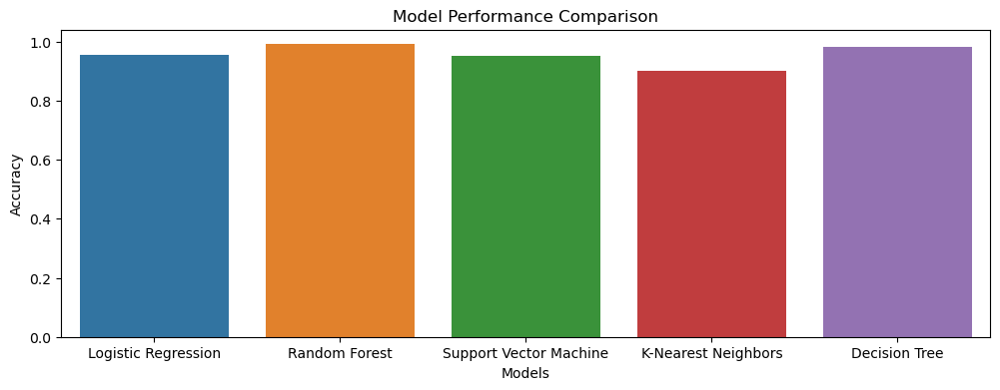

{'Logistic Regression': 0.9539936102236422,
 'Random Forest': 0.9910543130990416,
 'Support Vector Machine': 0.9523961661341853,
 'K-Nearest Neighbors': 0.902555910543131,
 'Decision Tree': 0.9824281150159745}

In [25]:
# Visualize model performance
plt.figure(figsize=(12, 4))
sns.barplot(x=list(model_performance.keys()), y=list(model_performance.values()))
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Performance Comparison')
plt.show()

model_performance

({'max_depth': 20,
  'max_features': 'sqrt',
  'min_samples_leaf': 1,
  'min_samples_split': 2,
  'n_estimators': 200},
 0.9927402132288773)

## Model Evaluation

In [26]:
from sklearn.metrics import confusion_matrix, classification_report

# Initialize the Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Train the model
rf_classifier.fit(X_train_transformed, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test_transformed)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred, zero_division=1)

# Display evaluation metrics
print(f"Random Forest Classifier Accuracy: {accuracy*100:.2f}%")
print(f"Confusion Matrix:\n{conf_matrix}")
print(f"Classification Report:\n{class_report}")

Random Forest Classifier Accuracy: 99.17%
Confusion Matrix:
[[ 132    0    0    0    0    0    0    0    0    0    0    0    0    0
     1    0    0    0    0    0    0    0    0    0]
 [   0   18    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0 1255    0    0    1    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0  377    0    0    0    0    5    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    1]
 [   0    0    0    0    4    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0   18    0    1    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0   27    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0]
 [   0    0    0    0    0    0    0   12    0    0    1    0    

## Filling Missing Migration Routes

In [27]:
prediction_target_set

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,total_dead_and_missing,migration_route,location_of_death,source,unsd_geographical_grouping,lat,lon,main_cause
4,2014,1,Northern Africa,Europe,Sudan,1,NaN,Border between Russia and Estonia,EUBusiness (Agence France-Presse),Northern Europe,59.155100,28.0000,environmental_factors
43,2014,3,Middle Africa,Eastern Africa,Congo,251,NaN,"Lake Albert, Uganda/DRC",BBC (UNHCR),Eastern Africa,1.632360,31.0000,drowning
47,2014,3,Central America,Central America,Guatemala,1,NaN,"Comitan, Chiapas, Mexico",El Siglo de Torreon,Central America,16.229960,-92.0000,accident
61,2014,4,Central America,Central America,"Honduras,Mexico",4,NaN,"On la Bestia, near Arriaga, Chiapas, Mexico",Soy 502,Central America,16.242196,-94.0000,murder_violence
70,2014,5,Caribbean,Caribbean,Unknown,9,NaN,"Dominican Republic, near Boca Chica and Juan D...",Dominican Today,Caribbean,18.307900,-70.0000,drowning
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14167,2014,3,Unknown,Horn of Africa,Unknown,44,NaN,Gulf of Aden,UNHCR,Uncategorized,12.533100,47.9224,drowning
14172,2014,2,Unknown,Horn of Africa,Unknown,17,NaN,Gulf of Aden (left from Djibouti),IOM,Uncategorized,20.280200,38.5126,drowning
14174,2014,2,Unknown,Caribbean,Unknown,8,NaN,Dominican Republic,AP,Caribbean,18.450500,-67.7966,drowning
14179,2014,1,Unknown,Caribbean,Unknown,1,NaN,"Off the coast of Fort Lauderdale, Florida",Local10.com,Caribbean,26.116000,-80.0464,drowning


In [28]:
# Predict 'migration_route' for unknown records
X_unknown_route = prediction_target_set.drop('migration_route', axis = 1)
for col in X_unknown_route.select_dtypes(include=['object']).columns:
    X_unknown_route[col] = label_encoder.fit_transform(X_unknown_route[col])
X_unknown_route

,year,reported_month,region_of_origin,region_of_incident,country_of_origin,total_dead_and_missing,location_of_death,source,unsd_geographical_grouping,lat,lon,main_cause
4,2014,1,12,5,86,1,346,270,9,59.155100,28.0000,4
43,2014,3,10,3,22,251,1027,107,4,1.632360,31.0000,3
47,2014,3,2,1,50,1,465,379,2,16.229960,-92.0000,0
61,2014,4,2,1,57,4,1443,955,2,16.242196,-94.0000,6
70,2014,5,0,0,91,9,554,255,0,18.307900,-70.0000,3
...,...,...,...,...,...,...,...,...,...,...,...,...
14167,2014,3,19,6,91,44,728,1032,14,12.533100,47.9224,3
14172,2014,2,19,6,91,17,730,510,14,20.280200,38.5126,3
14174,2014,2,19,0,91,8,553,34,0,18.450500,-67.7966,3
14179,2014,1,19,0,91,1,1411,724,0,26.116000,-80.0464,3


In [29]:
X_unknown_route_transformed = scaler.transform(X_unknown_route)
X_unknown_route_transformed

array([[-1.95389953, -1.70160922, -0.5329191 , ...,  3.28667888,
         0.89911149, -0.18033784],
       [-1.95389953, -1.09690546, -0.73922677, ..., -3.05653732,
         0.94450276, -0.56526241],
       [-1.95389953, -1.09690546, -1.56445745, ..., -1.44681334,
        -0.91653929, -1.7200361 ],
       ...,
       [-1.95389953, -1.39925734,  0.18915774, ..., -1.20194733,
        -0.55033161, -0.56526241],
       [-1.95389953, -1.70160922,  0.18915774, ..., -0.35664817,
        -0.73567627, -0.56526241],
       [-1.95389953, -1.70160922,  0.18915774, ...,  3.28667888,
         0.89697205, -0.18033784]])

In [30]:
predicted_route = rf_classifier.predict(X_unknown_route_transformed)

predicted_route


array(['Eastern Mediterranean', 'New Southern Africa Route',
       'Central America to US', ..., 'Dominican Republic to Puerto Rico',
       'Cuba to US', 'Eastern Mediterranean'], dtype=object)

In [31]:
prediction_target_set['migration_route'] = predicted_route

In [32]:
prediction_target_set['migration_route'].value_counts()

migration_route
Sahara Desert crossing               1294
Central America to US                 839
Horn Africa to Yemen                  411
Afghanistan to Iran                   402
Darien Gap                            207
Western African                       148
New Southern Africa Route             102
Eastern Mediterranean                  62
Western Balkans                        38
Iran to Turkey                         36
Turkey-Europe land route               32
Central Mediterranean                  32
Cuba to US                             30
English Channel to the UK              27
Comoros to Mayotte                     22
New South-eastern Asia Route           17
Western Mediterranean                  16
Dominican Republic to Puerto Rico      12
Syria to Türkiye                       11
Belarus-EU border                       4
Italy to France                         4
Haiti to Dominican Republic             3
Venezuela to Caribbean                  3
Ukraine to Europe 

round2 output:
Sahara Desert crossing               1305
Central America to US                 846
Horn Africa to Yemen                  382
Afghanistan to Iran                   375
Darien Gap                            208
Western African                       116
New Southern Africa Route             106
Eastern Mediterranean                  62
Turkey-Europe land route               55
Western Balkans                        52
New South-eastern Asia Route           42
Cuba to US                             32
Iran to Turkey                         32
English Channel to the UK              30
Comoros to Mayotte                     23
Syria to Türkiye                       21
Central Mediterranean                  20
Western Mediterranean                  15
Italy to France                         8
Belarus-EU border                       8
Dominican Republic to Puerto Rico       7
Haiti to Dominican Republic             4
Venezuela to Caribbean                  3
Ukraine to Europe                       1

In [33]:
predicted_route_file_path = 'data/predicted_route_new_routes_causes_extended.csv'
prediction_target_set.to_csv(predicted_route_file_path, index=False)


In [34]:
raw_data_missing_route['migration_route'] = predicted_route
raw_data_missing_route

/var/folders/kh/5kbp140j0wg8j3d9nrllg18h0000gn/T/ipykernel_6429/3158151138.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  raw_data_missing_route['migration_route'] = predicted_route


,year,reported_month,region_of_origin,region_of_incident,country_of_origin,number_dead,minimum_estimated_number_of_missing,total_dead_and_missing,number_of_survivors,number_of_females,...,dehydration_malnutrition,drowning,environmental_factors,lack_of_access_to_healthcare,murder_violence,sexual_abuse_rape,suicide,unknown,war_related,main_cause
4,2014,1,Northern Africa,Europe,Sudan,1.0,0.0,1,2.0,0.0,...,0,0,0,0,0,0,0,0,0,environmental_factors
43,2014,3,Middle Africa,Eastern Africa,Congo,251.0,0.0,251,50.0,0.0,...,0,0,0,0,0,0,0,0,0,drowning
47,2014,3,Central America,Central America,Guatemala,1.0,0.0,1,0.0,1.0,...,0,0,0,0,0,0,0,0,0,accident
61,2014,4,Central America,Central America,"Honduras,Mexico",4.0,0.0,4,3.0,0.0,...,0,0,0,0,0,0,0,0,0,murder_violence
70,2014,5,Caribbean,Caribbean,Unknown,6.0,3.0,9,16.0,0.0,...,0,0,0,0,0,0,0,0,0,drowning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14167,2014,3,Unknown,Horn of Africa,Unknown,0.0,44.0,44,33.0,0.0,...,0,0,0,0,0,0,0,0,0,drowning
14172,2014,2,Unknown,Horn of Africa,Unknown,11.0,6.0,17,0.0,0.0,...,0,0,0,0,0,0,0,0,0,drowning
14174,2014,2,Unknown,Caribbean,Unknown,8.0,0.0,8,0.0,0.0,...,0,0,0,0,0,0,0,0,0,drowning
14179,2014,1,Unknown,Caribbean,Unknown,1.0,0.0,1,0.0,0.0,...,0,0,0,0,0,0,0,0,0,drowning


In [35]:
concatenated_data = pd.concat([raw_data_missing_route, raw_data_notna_route])

In [36]:
concatenated_data.isna().sum()

year                                   0
reported_month                         0
region_of_origin                       0
region_of_incident                     0
country_of_origin                      0
number_dead                            0
minimum_estimated_number_of_missing    0
total_dead_and_missing                 0
number_of_survivors                    0
number_of_females                      0
number_of_males                        0
number_of_children                     0
cause_of_death                         0
migration_route                        0
location_of_death                      0
source                                 0
coordinates                            0
unsd_geographical_grouping             0
lat                                    0
lon                                    0
dataset                                0
accident                               0
asphyxiation_suffocation               0
dehydration_malnutrition               0
drowning        

In [50]:
concatenated_data_file_path = 'data/predicted_route_all_new_routes_source_extended.csv'
concatenated_data.to_csv(concatenated_data_file_path, index=False)

In [38]:
import folium
from sklearn.cluster import KMeans

def plot_migration_route_centers(route_lat_lon_data):
    # Initialize a base map
    m = folium.Map(location=[20, 0], zoom_start=3)

    # Create a color map
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred',  'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'gray']
    color_map = {route: colors[i % len(colors)] for i, route in enumerate(route_lat_lon_data['migration_route'].unique())}

    cluster_centers = []
    # Loop through each unique migration route
    for route in route_lat_lon_data['migration_route'].unique():
        # Extract the data for the current route
        route_data = route_lat_lon_data[route_lat_lon_data['migration_route'] == route][['lat', 'lon']]

        # Skip if only one sample
        if len(route_data) < 2:
            continue

        # Perform KMeans clustering with n_clusters set to 1
        kmeans = KMeans(n_clusters=1, random_state=0, n_init=10).fit(route_data)

        # Store the cluster center (single hotspot) in the dictionary
        hotspot = kmeans.cluster_centers_[0]

        # Append center coordinates and route name to the list
        cluster_centers.append({'migration_route': route, 'center_lat': hotspot[0], 'center_lon': hotspot[1]})

        # Get the color for this route from the color map
        route_color = color_map[route]

        # Plot individual data points on the map
        for i, row in route_data.iterrows():
            folium.CircleMarker(location=[row['lat'], row['lon']], radius=3, color=route_color, fill=True, fill_color=route_color).add_to(m)

        # Plot the single cluster center on the map
        folium.Marker(location=[hotspot[0], hotspot[1]], popup=f'{route} Center', icon=folium.Icon(color=route_color)).add_to(m)

    # Show the map
    return m, pd.DataFrame(cluster_centers)



In [39]:
route_lat_lon_data = concatenated_data[['lat', 'lon', 'migration_route']]
display(route_lat_lon_data)
m, updated_cluster_centers = plot_migration_route_centers(route_lat_lon_data)

m

,lat,lon,migration_route
4,59.155100,28.000000,Eastern Mediterranean
43,1.632360,31.000000,New Southern Africa Route
47,16.229960,-92.000000,Central America to US
61,16.242196,-94.000000,Central America to US
70,18.307900,-70.000000,Dominican Republic to Puerto Rico
...,...,...,...
14178,35.879300,-5.364070,Western Mediterranean
14180,50.935500,1.878660,English Channel to the UK
14181,37.283200,27.158200,Eastern Mediterranean
14182,32.058118,-111.623576,Central America to US


In [42]:
def plot_migration_route_centers(original_cluster_centers, updated_cluster_centers):
    # Initialize a base map
    m = folium.Map(location=[20, 0], zoom_start=3)

    # Create a color map
    colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
    color_map = {route: colors[i % len(colors)] for i, route in enumerate(original_cluster_centers['migration_route'].unique())}

    # Loop through each unique migration route
    for route in original_cluster_centers['migration_route'].unique():
        route_color = color_map[route]
        # Plot the original and updated cluster centers on the map
        original_center = original_cluster_centers.loc[original_cluster_centers['migration_route'] == route]
        updated_center = updated_cluster_centers.loc[updated_cluster_centers['migration_route'] == route]
        if not original_center.empty and not updated_center.empty:
            folium.Marker(location=[original_center['center_lat'].values[0], original_center['center_lon'].values[0]],
                          popup=f'{route} Original Center', icon=folium.Icon(color='gray')).add_to(m)
            folium.Marker(location=[updated_center['center_lat'].values[0], updated_center['center_lon'].values[0]],
                          popup=f'{route} Updated Center', icon=folium.Icon(color=route_color)).add_to(m)
            folium.PolyLine([(original_center['center_lat'].values[0], original_center['center_lon'].values[0]),
                             (updated_center['center_lat'].values[0], updated_center['center_lon'].values[0])],
                            color='gray').add_to(m)

    # Show the map
    return m



In [43]:

m = plot_migration_route_centers(original_cluster_centers, updated_cluster_centers)
m